### GEOG0051

Mining Social and Geographic Datasets
-----------------------------------

Machine Learning Analysis with Venue Review Data in Calgary, Canada
-------------------------------

Stephen Law, Igor Tkalec, Thomas Keel, and Gong Jie

For this second task, we would like you to analyse a dataset that contains review data of different venues in the city of Calgary,
Canada. With the help of several machine learning techniques that we have learnt in the course, you will be tasked to distill
insights from this social media dataset. Two of its notable features are the geocoding of every reviewed venues and the
availability of a considerable amount of text data in it, which lend to its ability to be processed using spatial and text analysis
techniques respectively.

As a prelude to the analysis prompts below, have a brief think about some of these questions: What can we discover about the
venue review data? Are there any spatial patterns that can be extracted from the data? Can we build a machine learning model
that predicts review rating for unseen data points using the text of the reviews?

### 3.1 Format of Data

The variables contained in the dataset provided in the `Calgary.csv` file, are:

* `business_id`, unique identifier of the premise
* `Name`, name of premise
* `latitude`, `longitude`, i.e. the locational attributes of the venue. <br/>
* `review_count` or the number of reviews the venue has been given<br/>
* `categories` general category of establishment that a venue falls under 
(Note: this variable is rather messy and might needs some cleaning/consolidation to be usable)<br/>
* `hours` or the opening hours of the venue <br/>
* `review_id` unique identifier of the review <br/>
* `user_id` unique identifier of the individual who left the review<br/>
* `stars_y` individual ratings of the venue<br/>
* `useful`, `funny`, `cool`, i.e. tags that the user attached to the review<br/>
* `text`, text of the review <br/>
* `date` i.e. the date of the review<br/>

### 3.2 Analysis Prompts

In [1]:
# import packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import string
import re
import geopandas as gpd
import seaborn as sns
import contextily as cx
from scipy.stats import pearsonr

import nltk
from nltk import sent_tokenize, word_tokenize, pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer,PorterStemmer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.corpus import wordnet

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, f1_score
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn import svm

import folium
from folium.plugins import MarkerCluster

#### 3.2.1 Loading and cleaning the textual dataset

In [2]:
# Data loading
Calgary = pd.read_csv('Calgary.csv')
print(Calgary.info())
Calgary

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82182 entries, 0 to 82181
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   business_id   82182 non-null  object 
 1   name          82182 non-null  object 
 2   latitude      82182 non-null  float64
 3   longitude     82182 non-null  float64
 4   review_count  82182 non-null  int64  
 5   categories    82182 non-null  object 
 6   hours         82182 non-null  object 
 7   review_id     82182 non-null  object 
 8   user_id       82182 non-null  object 
 9   stars_y       82182 non-null  float64
 10  useful        82182 non-null  int64  
 11  funny         82182 non-null  int64  
 12  cool          82182 non-null  int64  
 13  text          82182 non-null  object 
 14  date          82182 non-null  object 
dtypes: float64(3), int64(4), object(8)
memory usage: 9.4+ MB
None


,business_id,name,latitude,longitude,review_count,categories,hours,review_id,user_id,stars_y,useful,funny,cool,text,date
0,MbZMmwo-eL0Jnm_Yb9KJrA,Chinook Landscaping and Design,50.945960,-114.037207,3,"Contractors, Landscaping, Home Services","{'Monday': '7:0-17:0', 'Tuesday': '7:0-17:0', ...",pltqT0DnejbWN-K32BD1Fg,v6zuRbp5jjHroawRiv9IhQ,5.0,1,0,0,David came in the spring to give me an estimat...,2017-08-16 01:10:52
1,MbZMmwo-eL0Jnm_Yb9KJrA,Chinook Landscaping and Design,50.945960,-114.037207,3,"Contractors, Landscaping, Home Services","{'Monday': '7:0-17:0', 'Tuesday': '7:0-17:0', ...",8Iaf1YXNjo3zPd6-uLSJhg,UkL35C-EXA_yje4HeNINeQ,5.0,0,0,0,Chinook Landscaping is a Company that I would ...,2014-06-15 21:09:06
2,MbZMmwo-eL0Jnm_Yb9KJrA,Chinook Landscaping and Design,50.945960,-114.037207,3,"Contractors, Landscaping, Home Services","{'Monday': '7:0-17:0', 'Tuesday': '7:0-17:0', ...",fTU0yYLj78NJftEKah-woQ,CXhdG2DP0aplOZPZtNFobw,5.0,0,0,0,Chinook Landscaping is tops in my book\nI was ...,2013-08-22 22:10:38
3,rdg0b0tHKvSCQNl6u3tS_A,SML Entertainment,51.084990,-113.989605,5,"Shopping, Caterers, Furniture Stores, Hot Tub ...","{'Monday': '8:0-17:0', 'Tuesday': '8:0-17:0', ...",2SGfqlKDjuFpXZ7LjdNJSQ,siNu6MF02MSMnoyPkaxZyg,5.0,5,0,0,If you are looking for a supplier of games tab...,2009-06-29 02:20:25
4,rdg0b0tHKvSCQNl6u3tS_A,SML Entertainment,51.084990,-113.989605,5,"Shopping, Caterers, Furniture Stores, Hot Tub ...","{'Monday': '8:0-17:0', 'Tuesday': '8:0-17:0', ...",5RfnOMsGcQ26EoXlteFOyw,-InhDRRVG7wrwsgAUvN4Qw,5.0,6,3,3,"SML is now a personal wet dream of mine, the e...",2009-12-03 17:29:51
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82177,knifdfgaeWZ-277S6lsSnA,Martin's Pest Control,50.905732,-114.066646,3,"Pest Control, Local Services","{'Monday': '0:0-0:0', 'Tuesday': '8:30-16:30',...",pd7i8sxkMfbjdWR926nz8Q,zYLF37lcx2MPIHZVJjahBA,5.0,1,1,0,"I rarely post reviews, but wanted to express h...",2016-08-18 14:19:05
82178,knifdfgaeWZ-277S6lsSnA,Martin's Pest Control,50.905732,-114.066646,3,"Pest Control, Local Services","{'Monday': '0:0-0:0', 'Tuesday': '8:30-16:30',...",Uu4txscaQB25tF5kuG4gkg,rlY-ah6vhTHiRkJMEtDJ-g,5.0,1,0,0,I used Martin's Pest Control for an under-conc...,2015-10-17 23:16:52
82179,Q4-TlHSvl45XMg2Y1wEVJQ,Home-Alyze,51.099332,-114.012717,3,"Home Services, Home Inspectors","{'Monday': '9:0-21:0', 'Tuesday': '9:0-21:0', ...",kooH5UmJ5k-8USDe03jI9Q,Id5k4kNeblkyQSuteVURGQ,1.0,6,0,0,"This company came into my home, 'inspected' th...",2011-09-09 20:22:04
82180,Q4-TlHSvl45XMg2Y1wEVJQ,Home-Alyze,51.099332,-114.012717,3,"Home Services, Home Inspectors","{'Monday': '9:0-21:0', 'Tuesday': '9:0-21:0', ...",2SUoFTckEOdGd1V7GpIvrg,grsdpOuwSdwN3ndafhfa9Q,1.0,3,0,0,I would never recommend them to anyone. I pur...,2013-08-02 07:21:12


In [3]:
# select attributes will be used/ focused on
Calgary = Calgary[['business_id','name', 'latitude','longitude','categories','stars_y','useful','funny','cool','text']]
Calgary.head()

,business_id,name,latitude,longitude,categories,stars_y,useful,funny,cool,text
0,MbZMmwo-eL0Jnm_Yb9KJrA,Chinook Landscaping and Design,50.94596,-114.037207,"Contractors, Landscaping, Home Services",5.0,1,0,0,David came in the spring to give me an estimat...
1,MbZMmwo-eL0Jnm_Yb9KJrA,Chinook Landscaping and Design,50.94596,-114.037207,"Contractors, Landscaping, Home Services",5.0,0,0,0,Chinook Landscaping is a Company that I would ...
2,MbZMmwo-eL0Jnm_Yb9KJrA,Chinook Landscaping and Design,50.94596,-114.037207,"Contractors, Landscaping, Home Services",5.0,0,0,0,Chinook Landscaping is tops in my book\nI was ...
3,rdg0b0tHKvSCQNl6u3tS_A,SML Entertainment,51.08499,-113.989605,"Shopping, Caterers, Furniture Stores, Hot Tub ...",5.0,5,0,0,If you are looking for a supplier of games tab...
4,rdg0b0tHKvSCQNl6u3tS_A,SML Entertainment,51.08499,-113.989605,"Shopping, Caterers, Furniture Stores, Hot Tub ...",5.0,6,3,3,"SML is now a personal wet dream of mine, the e..."


In [4]:
# cleaning ratings of the venue -- delete rows that contain values other than 1, 2, 3, 4, or 5 in stars_y column
Calgary = Calgary[Calgary['stars_y'].isin([ 1, 2, 3, 4, 5])]
Calgary.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 82182 entries, 0 to 82181
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   business_id  82182 non-null  object 
 1   name         82182 non-null  object 
 2   latitude     82182 non-null  float64
 3   longitude    82182 non-null  float64
 4   categories   82182 non-null  object 
 5   stars_y      82182 non-null  float64
 6   useful       82182 non-null  int64  
 7   funny        82182 non-null  int64  
 8   cool         82182 non-null  int64  
 9   text         82182 non-null  object 
dtypes: float64(3), int64(3), object(4)
memory usage: 6.9+ MB


In [5]:
# select reviews with at least one useful/funny/cool tag
Calgary1 = Calgary[(Calgary['useful'] >= 1) | (Calgary['funny'] >= 1) | (Calgary['cool'] >= 1)]
print(Calgary1.info())
Calgary1.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 42829 entries, 0 to 82180
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   business_id  42829 non-null  object 
 1   name         42829 non-null  object 
 2   latitude     42829 non-null  float64
 3   longitude    42829 non-null  float64
 4   categories   42829 non-null  object 
 5   stars_y      42829 non-null  float64
 6   useful       42829 non-null  int64  
 7   funny        42829 non-null  int64  
 8   cool         42829 non-null  int64  
 9   text         42829 non-null  object 
dtypes: float64(3), int64(3), object(4)
memory usage: 3.6+ MB
None


,business_id,name,latitude,longitude,categories,stars_y,useful,funny,cool,text
0,MbZMmwo-eL0Jnm_Yb9KJrA,Chinook Landscaping and Design,50.94596,-114.037207,"Contractors, Landscaping, Home Services",5.0,1,0,0,David came in the spring to give me an estimat...
3,rdg0b0tHKvSCQNl6u3tS_A,SML Entertainment,51.08499,-113.989605,"Shopping, Caterers, Furniture Stores, Hot Tub ...",5.0,5,0,0,If you are looking for a supplier of games tab...
4,rdg0b0tHKvSCQNl6u3tS_A,SML Entertainment,51.08499,-113.989605,"Shopping, Caterers, Furniture Stores, Hot Tub ...",5.0,6,3,3,"SML is now a personal wet dream of mine, the e..."
5,rdg0b0tHKvSCQNl6u3tS_A,SML Entertainment,51.08499,-113.989605,"Shopping, Caterers, Furniture Stores, Hot Tub ...",1.0,1,0,0,Went in to the south location today to buy a S...
6,rdg0b0tHKvSCQNl6u3tS_A,SML Entertainment,51.08499,-113.989605,"Shopping, Caterers, Furniture Stores, Hot Tub ...",1.0,6,0,1,My husband and I were shopping around for a ho...


In [6]:
# select a sample dataset: venue categiries in resturants
Calgary_r = Calgary1[Calgary1['categories'].str.contains('restaurants', case=False)]
print(Calgary_r.info())
Calgary_r.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25388 entries, 27 to 82167
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   business_id  25388 non-null  object 
 1   name         25388 non-null  object 
 2   latitude     25388 non-null  float64
 3   longitude    25388 non-null  float64
 4   categories   25388 non-null  object 
 5   stars_y      25388 non-null  float64
 6   useful       25388 non-null  int64  
 7   funny        25388 non-null  int64  
 8   cool         25388 non-null  int64  
 9   text         25388 non-null  object 
dtypes: float64(3), int64(3), object(4)
memory usage: 2.1+ MB
None


,business_id,name,latitude,longitude,categories,stars_y,useful,funny,cool,text
27,AsgwKCJqyBqdiHdEBqeq3w,Singapore Sam's,51.042296,-114.073224,"Chinese, Restaurants, Buffets",4.0,3,7,4,There is an unfortunate amount of hate-on goin...
28,AsgwKCJqyBqdiHdEBqeq3w,Singapore Sam's,51.042296,-114.073224,"Chinese, Restaurants, Buffets",5.0,0,1,0,Coolest late night place to eat I have ever se...
30,AsgwKCJqyBqdiHdEBqeq3w,Singapore Sam's,51.042296,-114.073224,"Chinese, Restaurants, Buffets",1.0,1,0,0,I can't imagine actually planning to go to Sin...
31,AsgwKCJqyBqdiHdEBqeq3w,Singapore Sam's,51.042296,-114.073224,"Chinese, Restaurants, Buffets",3.0,0,1,0,Stopped here because I was desperate for wifi....
32,AsgwKCJqyBqdiHdEBqeq3w,Singapore Sam's,51.042296,-114.073224,"Chinese, Restaurants, Buffets",1.0,2,0,0,Omg this place is sad!!! I remember going here...


In [7]:
# check the distribution of selected attributes

## number of resturants
unique_values = Calgary_r['business_id'].unique()
len(unique_values)

1760

In [8]:
Calgary_r.describe()

,latitude,longitude,stars_y,useful,funny,cool
count,25388.000000,25388.000000,25388.000000,25388.000000,25388.000000,25388.000000
mean,51.043823,-114.071794,3.616275,1.898495,0.648653,0.735859
std,0.047405,0.049145,1.341393,2.046371,1.400527,1.461372
min,50.875574,-114.280098,1.000000,0.000000,0.000000,0.000000
25%,51.037542,-114.086230,3.000000,1.000000,0.000000,0.000000
50%,51.044625,-114.070854,4.000000,1.000000,0.000000,0.000000
75%,51.061146,-114.056477,5.000000,2.000000,1.000000,1.000000
max,51.174869,-113.908455,5.000000,60.000000,41.000000,44.000000


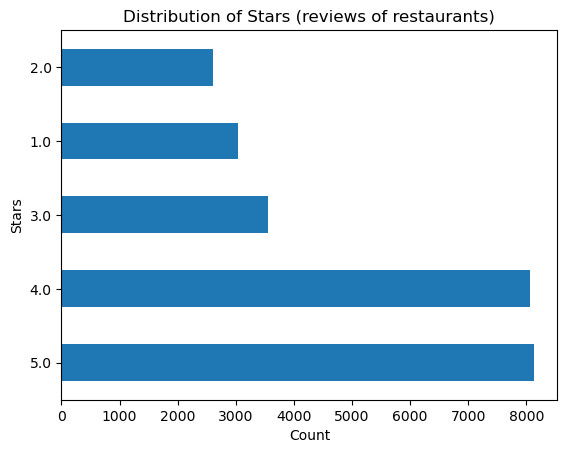

In [9]:
## show the distribution of the stars_y column - horizontal bar chart
star_counts = Calgary_r['stars_y'].value_counts()

fig, ax = plt.subplots()
star_counts.plot.barh(ax=ax)
ax.set_title('Distribution of Stars (reviews of restaurants)')
ax.set_xlabel('Count')
ax.set_ylabel('Stars')
plt.show()

In [10]:
# select a out-of-sample testset

## Categories of entire dataset
category1_counts = Calgary1['categories'].value_counts().sort_values()
category1_counts

Contractors, Landscaping, Home Services                                                                                                        1
Chinese, Barbeque, Canadian (New), Restaurants                                                                                                 1
Food, Sandwiches, Beer, Wine & Spirits, Coffee & Tea, Restaurants                                                                              1
Real Estate Services, Real Estate, Apartments, Home Services, Professional Services                                                            1
Hiking, Sporting Goods, Climbing, Outdoor Gear, Shopping, Active Life, Ski & Snowboard Shops, Fitness & Instruction, Amateur Sports Teams      1
                                                                                                                                            ... 
Restaurants, Steakhouses                                                                                                          

In [11]:
## Find a sample with size between 200 and 300 and does not belong to the restaurant category
print(category1_counts[(category1_counts > 200) & (category1_counts < 300) & (~category1_counts.index.str.contains('Restaurants'))])

Airports, Hotels & Travel    251
Name: categories, dtype: int64


In [12]:
## Select Airports, Hotels & Travel as out-of-sample testset
Calgary_a = Calgary1[Calgary1['categories'] == 'Airports, Hotels & Travel']
print(Calgary_a.info())
Calgary_a.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 251 entries, 28212 to 28560
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   business_id  251 non-null    object 
 1   name         251 non-null    object 
 2   latitude     251 non-null    float64
 3   longitude    251 non-null    float64
 4   categories   251 non-null    object 
 5   stars_y      251 non-null    float64
 6   useful       251 non-null    int64  
 7   funny        251 non-null    int64  
 8   cool         251 non-null    int64  
 9   text         251 non-null    object 
dtypes: float64(3), int64(3), object(4)
memory usage: 21.6+ KB
None


,business_id,name,latitude,longitude,categories,stars_y,useful,funny,cool,text
28212,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",1.0,1,0,0,"Great airport normally, but really 1 hr on a p..."
28214,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",3.0,0,0,1,It's an airport It was fast and painless. Love...
28215,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",5.0,1,0,0,We flew into Calgary International Airport (YY...
28217,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",2.0,0,2,0,Calgary International Airport is an excellent ...
28218,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",2.0,1,0,1,I only ever connect through here en route to E...


In [13]:
# Text Cleaning
Calgary2 = pd.concat([Calgary_a, Calgary_r])
print(Calgary2.info())
Calgary2

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25639 entries, 28212 to 82167
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   business_id  25639 non-null  object 
 1   name         25639 non-null  object 
 2   latitude     25639 non-null  float64
 3   longitude    25639 non-null  float64
 4   categories   25639 non-null  object 
 5   stars_y      25639 non-null  float64
 6   useful       25639 non-null  int64  
 7   funny        25639 non-null  int64  
 8   cool         25639 non-null  int64  
 9   text         25639 non-null  object 
dtypes: float64(3), int64(3), object(4)
memory usage: 2.2+ MB
None


,business_id,name,latitude,longitude,categories,stars_y,useful,funny,cool,text
28212,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.016890,"Airports, Hotels & Travel",1.0,1,0,0,"Great airport normally, but really 1 hr on a p..."
28214,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.016890,"Airports, Hotels & Travel",3.0,0,0,1,It's an airport It was fast and painless. Love...
28215,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.016890,"Airports, Hotels & Travel",5.0,1,0,0,We flew into Calgary International Airport (YY...
28217,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.016890,"Airports, Hotels & Travel",2.0,0,2,0,Calgary International Airport is an excellent ...
28218,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.016890,"Airports, Hotels & Travel",2.0,1,0,1,I only ever connect through here en route to E...
...,...,...,...,...,...,...,...,...,...,...
82157,JH0hzxsWwiOMqptIL0axBQ,IL CHIANTI RESTAURANT,51.070635,-114.056308,"Restaurants, Italian",4.0,3,0,0,This restaurant gets 3 stars and earned an ext...
82161,JH0hzxsWwiOMqptIL0axBQ,IL CHIANTI RESTAURANT,51.070635,-114.056308,"Restaurants, Italian",1.0,0,1,0,Great food. Came in in a hoodie got overlooked...
82162,JH0hzxsWwiOMqptIL0axBQ,IL CHIANTI RESTAURANT,51.070635,-114.056308,"Restaurants, Italian",4.0,0,1,0,The place is beautiful and quite Italian inspi...
82166,_xITq0q08REnLLfgaHMEog,KFC,50.969186,-114.070789,"Fast Food, Chicken Wings, American (Traditiona...",1.0,1,0,0,Visited 3 times this month and the service fro...


In [14]:
## Download nltk resources
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('vader_lexicon')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\lls\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\lls\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\lls\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\lls\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [15]:
## Define parts of speech tagging
def get_wordnet_pos(treebank_tag):
    if treebank_tag.startswith('J'):
        return wordnet.ADJ
    elif treebank_tag.startswith('V'):
        return wordnet.VERB
    elif treebank_tag.startswith('N'):
        return wordnet.NOUN
    elif treebank_tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN ## if the POS tag is not one of the above, default to noun
    
## Define text cleaning function
def clean_text(text):
    ## Removal of numbers
    text = re.sub(r'\d+', '', text)

    ## Remove punctuation and irrelevant text
    text = re.sub(r'http\S+', '', text)
    text = re.sub(r'@[^\s]+', '', text)
    text = re.sub(r'#([^\s]+)', r'\1', text)
    text = text.translate(str.maketrans('', '', string.punctuation))

    ## Tokenization
    tokens = word_tokenize(text)
    
    ## Parts of Speech tagging
    pos = pos_tag(tokens)

    ## Removal of short words, stopwords, and non-nouns
    stop_words = set(stopwords.words('english'))
    tokens = [token for token in tokens if len(token) > 2 and token.lower() not in stop_words and pos_tag([token])[0][1] in ['NN', 'NNS']]
    
    ## Normalizing words with stemming
    stemmer = PorterStemmer()
    lemmatizer = WordNetLemmatizer()
    normalized_tokens = []
    tokens = [stemmer.stem(token) for token in tokens]
    
    for word, tag in pos_tag(tokens):
        ## Translate emotions
        if word.lower() in ['not', 'cannot','can\'t', 'couldn\'t', 'didn\'t', 'doesn\'t', 'hadn\'t', 'hasn\'t', 'haven\'t', 'isn\'t', 'mightn\'t', 'mustn\'t', 'neither', 'nor', 'shan\'t', 'shouldn\'t', 'wasn\'t', 'weren\'t', 'won\'t', 'wouldn\'t']:
            normalized_tokens.append('NOT_' + word.upper())
        elif word.lower() in ['very', 'really', 'so', 'too']:
            normalized_tokens.append(word)
        else:
            pos = get_wordnet_pos(tag)
            ## Lemmatization
            lemma = lemmatizer.lemmatize(word, pos=pos)
            normalized_tokens.append(lemma)    

    ## Rejoin cleaned tokens into a string
    text = ' '.join(tokens)
    return text


In [16]:
## Apply the clean_text function to the "text" column and save the results to a new column "clean_text"
Calgary2['clean_text'] = Calgary2['text'].apply(clean_text)

In [17]:
## Add a new column for sentiment analysis
sid = SentimentIntensityAnalyzer()
Calgary2['sentiment'] = Calgary2['clean_text'].apply(lambda x: sid.polarity_scores(x)['compound'])

In [18]:
# save cleaned data to csv
Calgary2.to_csv('Calgary_clean.csv', index=False)

Due to the lengthy execution of text cleaning, we saved the cleaned data as csv and import it again in further study for convenience.

In [3]:
# After data cleaning - Import cleaned data
df = pd.read_csv('Calgary_clean.csv')
print(df.info())
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25639 entries, 0 to 25638
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   business_id  25639 non-null  object 
 1   name         25639 non-null  object 
 2   latitude     25639 non-null  float64
 3   longitude    25639 non-null  float64
 4   categories   25639 non-null  object 
 5   stars_y      25639 non-null  float64
 6   useful       25639 non-null  int64  
 7   funny        25639 non-null  int64  
 8   cool         25639 non-null  int64  
 9   text         25639 non-null  object 
 10  clean_text   25637 non-null  object 
 11  sentiment    25639 non-null  float64
dtypes: float64(4), int64(3), object(5)
memory usage: 2.3+ MB
None


,business_id,name,latitude,longitude,categories,stars_y,useful,funny,cool,text,clean_text,sentiment
0,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",1.0,1,0,0,"Great airport normally, but really 1 hr on a p...",great airport plane,0.6249
1,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",3.0,0,0,1,It's an airport It was fast and painless. Love...,airport fast painless clear custom idea thank,0.7430
2,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",5.0,1,0,0,We flew into Calgary International Airport (YY...,flew airport yyc seattl termin thing look term...,0.7906
3,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",2.0,0,2,0,Calgary International Airport is an excellent ...,airport excel facil way effici clean staf shop...,0.8484
4,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",2.0,1,0,1,I only ever connect through here en route to E...,connect rout edmonton edmonton dislik whenev p...,-0.2263


In [3]:
# out-of-sample testset: Airports, Hotels & Travel
df_a = df[df['categories'] == 'Airports, Hotels & Travel']
print(df_a.info())
df_a.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 251 entries, 0 to 250
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   business_id  251 non-null    object 
 1   name         251 non-null    object 
 2   latitude     251 non-null    float64
 3   longitude    251 non-null    float64
 4   categories   251 non-null    object 
 5   stars_y      251 non-null    float64
 6   useful       251 non-null    int64  
 7   funny        251 non-null    int64  
 8   cool         251 non-null    int64  
 9   text         251 non-null    object 
 10  clean_text   251 non-null    object 
 11  sentiment    251 non-null    float64
dtypes: float64(4), int64(3), object(5)
memory usage: 25.5+ KB
None


,business_id,name,latitude,longitude,categories,stars_y,useful,funny,cool,text,clean_text,sentiment
0,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",1.0,1,0,0,"Great airport normally, but really 1 hr on a p...",great airport plane,0.6249
1,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",3.0,0,0,1,It's an airport It was fast and painless. Love...,airport fast painless clear custom idea thank,0.7430
2,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",5.0,1,0,0,We flew into Calgary International Airport (YY...,flew airport yyc seattl termin thing look term...,0.7906
3,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",2.0,0,2,0,Calgary International Airport is an excellent ...,airport excel facil way effici clean staf shop...,0.8484
4,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",2.0,1,0,1,I only ever connect through here en route to E...,connect rout edmonton edmonton dislik whenev p...,-0.2263


In [4]:
# sample dataset: venue categiries in resturants
dfr = df[df['categories'].str.contains('restaurants', case=False)]
print(dfr.info())
dfr.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25388 entries, 251 to 25638
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   business_id  25388 non-null  object 
 1   name         25388 non-null  object 
 2   latitude     25388 non-null  float64
 3   longitude    25388 non-null  float64
 4   categories   25388 non-null  object 
 5   stars_y      25388 non-null  float64
 6   useful       25388 non-null  int64  
 7   funny        25388 non-null  int64  
 8   cool         25388 non-null  int64  
 9   text         25388 non-null  object 
 10  clean_text   25386 non-null  object 
 11  sentiment    25388 non-null  float64
dtypes: float64(4), int64(3), object(5)
memory usage: 2.5+ MB
None


,business_id,name,latitude,longitude,categories,stars_y,useful,funny,cool,text,clean_text,sentiment
251,AsgwKCJqyBqdiHdEBqeq3w,Singapore Sam's,51.042296,-114.073224,"Chinese, Restaurants, Buffets",4.0,3,7,4,There is an unfortunate amount of hate-on goin...,unfortun amount hateon sam ive honest rescu co...,0.8401
252,AsgwKCJqyBqdiHdEBqeq3w,Singapore Sam's,51.042296,-114.073224,"Chinese, Restaurants, Buffets",5.0,0,1,0,Coolest late night place to eat I have ever se...,night place eat fun dump nhl player,0.1779
253,AsgwKCJqyBqdiHdEBqeq3w,Singapore Sam's,51.042296,-114.073224,"Chinese, Restaurants, Buffets",1.0,1,0,0,I can't imagine actually planning to go to Sin...,cant imagin plan sam someth happen youv youv c...,0.0000
254,AsgwKCJqyBqdiHdEBqeq3w,Singapore Sam's,51.042296,-114.073224,"Chinese, Restaurants, Buffets",3.0,0,1,0,Stopped here because I was desperate for wifi....,desper wifi restaur dinner time look latenight...,-0.1531
255,AsgwKCJqyBqdiHdEBqeq3w,Singapore Sam's,51.042296,-114.073224,"Chinese, Restaurants, Buffets",1.0,2,0,0,Omg this place is sad!!! I remember going here...,omg place sad teenag experi year weve shot jee...,-0.7681


In [5]:
dfr = dfr.dropna()
dfr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25386 entries, 251 to 25638
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   business_id  25386 non-null  object 
 1   name         25386 non-null  object 
 2   latitude     25386 non-null  float64
 3   longitude    25386 non-null  float64
 4   categories   25386 non-null  object 
 5   stars_y      25386 non-null  float64
 6   useful       25386 non-null  int64  
 7   funny        25386 non-null  int64  
 8   cool         25386 non-null  int64  
 9   text         25386 non-null  object 
 10  clean_text   25386 non-null  object 
 11  sentiment    25386 non-null  float64
dtypes: float64(4), int64(3), object(5)
memory usage: 2.5+ MB


In [6]:
## number of resturants
unique_values = dfr['business_id'].unique()
len(unique_values)

1760

In [7]:
dfr.describe()

,latitude,longitude,stars_y,useful,funny,cool,sentiment
count,25386.000000,25386.000000,25386.000000,25386.000000,25386.000000,25386.000000,25386.000000
mean,51.043817,-114.071784,3.616324,1.898606,0.648665,0.735917,0.414905
std,0.047402,0.049133,1.341406,2.046409,1.400574,1.461415,0.476717
min,50.875574,-114.280098,1.000000,0.000000,0.000000,0.000000,-0.983100
25%,51.037525,-114.086230,3.000000,1.000000,0.000000,0.000000,0.000000
50%,51.044625,-114.070854,4.000000,1.000000,0.000000,0.000000,0.552300
75%,51.061093,-114.056477,5.000000,2.000000,1.000000,1.000000,0.825600
max,51.174869,-113.908455,5.000000,60.000000,41.000000,44.000000,0.998400


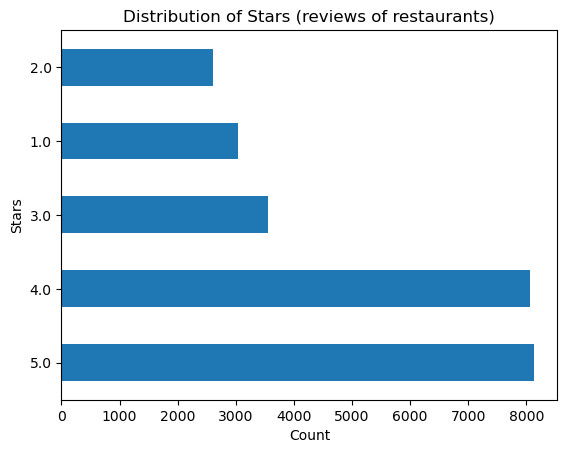

In [8]:
## show the distribution of the stars_y column - horizontal bar chart
star_counts = dfr['stars_y'].value_counts()

fig, ax = plt.subplots()
star_counts.plot.barh(ax=ax)
ax.set_title('Distribution of Stars (reviews of restaurants)')
ax.set_xlabel('Count')
ax.set_ylabel('Stars')
plt.show()

In [6]:
# Lexicon-based Sentiment Analysis

##calculate the mean of the sentiment score and stars for each restaurant in df_r. 
dfr_avg_sen=pd.DataFrame(dfr.groupby(['business_id'])['sentiment'].mean())
dfr_avg_stars=pd.DataFrame(dfr.groupby(['business_id'])['stars_y'].mean())

In [7]:
## Create a new data frame that concatenates the average sentiment score and the average stars for each restaurant
dfr1=pd.concat([dfr_avg_sen,dfr_avg_stars],axis=1)
dfr1

,sentiment,stars_y
business_id,,
--1UhMGODdWsrMastO9DZw,0.235393,4.000000
-0RU0vASJOV383dYA8VZgA,0.499150,3.666667
-1u4Q4U6OZ-CvqoxUh7gKg,0.427535,4.117647
-2C96suwzrE_cqI1U69cLA,0.549276,3.684211
-2WW_cjFa9-UwKSmbEs78Q,0.493780,4.100000
...,...,...
zaNBZTnMjGis7YteXCRgUg,0.129967,2.833333
zn0425hu9T_AWMMaTiPKyg,-0.161733,1.000000
zwFScgZRXOsWnucfwyn8pw,0.488664,3.454545


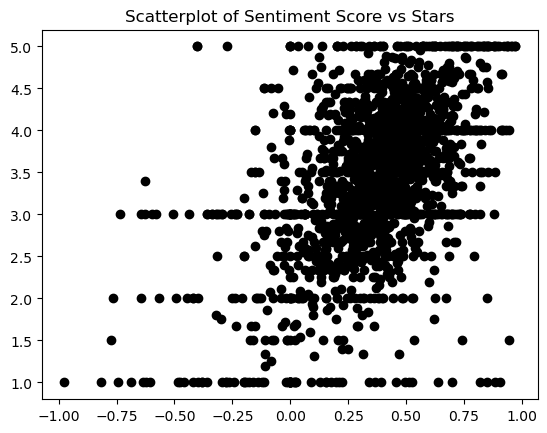

In [8]:
## scatterplot between the sentiment score and the stars
plt.scatter(dfr1['sentiment'],dfr1['stars_y'],color='black')
plt.title('Scatterplot of Sentiment Score vs Stars')
plt.show()

In [9]:
corr, p_value = pearsonr(dfr1['sentiment'],dfr1['stars_y'])
print("Pearson correlation coefficient:", corr)
print("p-value:", p_value)

Pearson correlation coefficient: 0.4955655018618933
p-value: 1.0066894344197439e-109


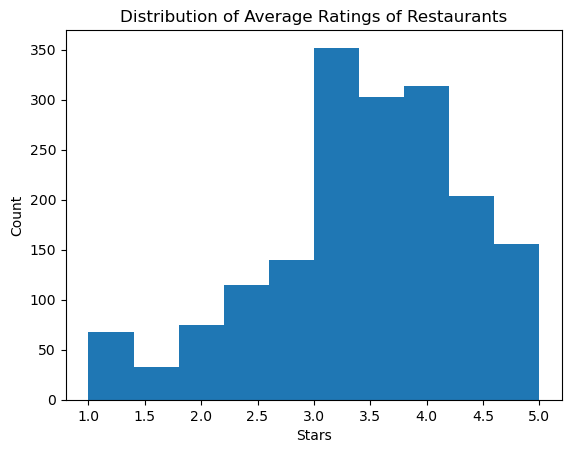

In [12]:
## show the distribution of Average Ratings of Restaurants
star_ratings = dfr1['stars_y']

fig, ax = plt.subplots()
ax.hist(star_ratings, bins=10)
ax.set_title('Distribution of Average Ratings of Restaurants')
ax.set_xlabel('Stars')
ax.set_ylabel('Count')
plt.show()

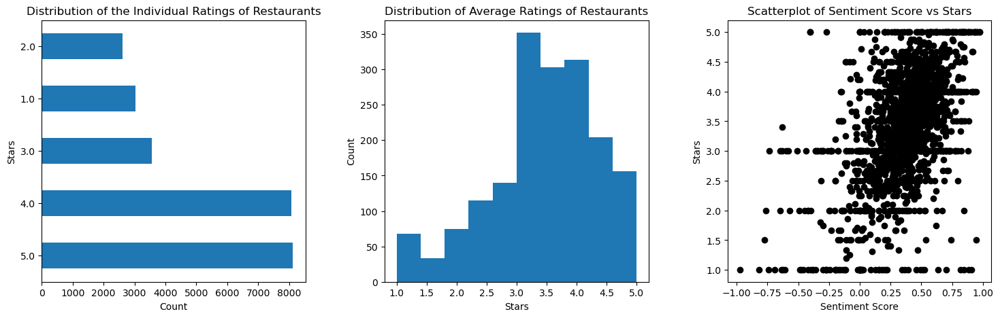

In [13]:
## multiple sub-figures of attributes' data distributions (restaurants)
fig, axs = plt.subplots(1, 3, figsize=(18, 5))

# Plot the first subplot - Distribution of the individual ratings of restaurants
star_counts = dfr['stars_y'].value_counts()
star_counts.plot.barh(ax=axs[0])
axs[0].set_title('Distribution of the Individual Ratings of Restaurants')
axs[0].set_xlabel('Count')
axs[0].set_ylabel('Stars')

# Plot the second subplot - Distribution of Average Ratings of Restaurants
star_ratings = dfr1['stars_y']
axs[1].hist(star_ratings, bins=10)
axs[1].set_title('Distribution of Average Ratings of Restaurants')
axs[1].set_xlabel('Stars')
axs[1].set_ylabel('Count')

# Plot the third subplot - Scatterplot of Sentiment Score vs Stars
axs[2].scatter(dfr1['sentiment'], dfr1['stars_y'], color='black')
axs[2].set_title('Scatterplot of Sentiment Score vs Stars')
axs[2].set_xlabel('Sentiment Score')
axs[2].set_ylabel('Stars')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.3)

# Show the figure
plt.show()

#### 3.2.2 Build a supervised learning model for text analysis

In [14]:
# Tokenize the pre-processed review text data to give a bag-of-words feature.

## Shuffle the rows of the DataFrame
dataset = dfr.sample(frac=1, random_state=1)

## Extract the review text as a list of documents
documents = dataset['clean_text'].tolist()

In [15]:
type(documents)

list

In [16]:
dataset

,business_id,name,latitude,longitude,categories,stars_y,useful,funny,cool,text,clean_text,sentiment
20718,F8nkAcuCNH-09AWnfv_oWw,Sho Sushi Bar & Kitchen,50.988936,-114.071009,"Sushi Bars, Japanese, Restaurants",5.0,0,0,1,Best high end but authentic sushi I've found i...,end sushi ive found food server help cold saki...,0.6808
15486,Msw1bg7KGcZ87NEAoABIJg,Masala Bhavan,51.013012,-114.140126,"Restaurants, Vegetarian, Bars, Nightlife, Indi...",4.0,4,0,0,"First time here, tried lunch buffet and enjoye...",time lunch buffet butter chicken deep ring bea...,0.3612
3690,c0dMOGUySidcUgPRaN0nEA,Fergus & Bix,51.059920,-114.211972,"Canadian (New), Restaurants, Beer, Wine & Spir...",2.0,2,1,0,I realize that this is the suburbs and people ...,suburb peopl lack perspect option remain anyon...,-0.6369
8326,El1HTj_hsRyRdOEbzJqgfg,Paros Souvla,51.152232,-114.210802,"Restaurants, Greek",4.0,0,1,0,Got the chicken souvlaki platter with village ...,chicken souvlaki platter villag salad chicken ...,-0.7506
8490,A5qHFRJOZZuEHi4yXTR2Kw,Original Joe's,51.022993,-114.108992,"Nightlife, Pubs, Bars, Restaurants, American (...",2.0,1,0,0,There's nothing unique about Original Joe's.\n...,there noth uniqu joe becom chain menu ive dece...,-0.4588
...,...,...,...,...,...,...,...,...,...,...,...,...
11206,1tUUCVKiFRfocWjKJgL3Gg,Domino's Pizza,50.932429,-113.983097,"Pizza, Restaurants, Italian",1.0,1,0,0,Ordered a thin crust Canadian pizza last night...,thin crust pizza night chees bread dinner wher...,0.0000
17541,FdwJRs1DrrmhmLUNWa7UzA,Khao San Thai Kitchen,51.037828,-114.092371,"Thai, Restaurants",5.0,1,0,1,Coconut soup was perfect! The portions are not...,coconut soup perfect portion place finish dish...,0.4588
5443,kmOeRAvOL1oR6Z-4Ggdx6w,Charcut Roast House,51.044727,-114.063370,"Restaurants, Steakhouses",4.0,1,0,0,"On our last day visiting Banff/Calgary, we fou...",day found charcut eater list server major dish...,-0.1027
12423,FyTX0kl3D2VJ1jp1HRXALg,Mercato Italian Gourmet,51.032860,-114.071178,"Restaurants, Italian",3.0,5,0,2,I hate to say this buy our dinner last night w...,hate dinner night wasnt mercato year weve thou...,0.7650


In [17]:
documents

['end sushi ive found food server help cold saki niav regard match thankyou relax fast favourit sushi place',
 'time lunch buffet butter chicken deep ring bean lentil nann dosa recommend other',
 'suburb peopl lack perspect option remain anyon rate food price pay entre restaur mediocr pub suburb drop price amount return warn other time money',
 'chicken souvlaki platter villag salad chicken tender flavor salad thank slab feta sprinkl oregano pita bread disappoint pepper portion size price leftov lunch prompt ill definiltey',
 'there noth uniqu joe becom chain menu ive decent meal pork sandwich tasti soup theyd ichiban threw veget ichiban yeah right patio summer citi drink itll interior use overhaul imagin girl lifeless lack sens homey uniqu feel independ guy let face itmani guy target oj guysim sure youll dig',
 'famili style restaur peopl famili dinner kind pasta chees dollar pasta',
 'wasnt right waitress guy bar order rib cold sent redon aka apolog wet nap strang loung set thank did

In [18]:
len(documents)

25386

In [19]:
## Tokenize
no_features=1000
tf_vectorizer = CountVectorizer(max_df=0.95, min_df=2, max_features=no_features)
tf_vectorizer.fit_transform(documents)
tf_feature_names = tf_vectorizer.get_feature_names_out()

In [20]:
tf_feature_names

array(['absolut', 'accommod', 'addit', 'admit', 'adult', 'afternoon',
       'age', 'agre', 'airport', 'alberta', 'allergi', 'almond',
       'alright', 'altern', 'alway', 'amaz', 'ambianc', 'ambienc',
       'amount', 'answer', 'anyon', 'anyth', 'anyway', 'apolog', 'app',
       'appet', 'appi', 'appl', 'appreci', 'area', 'arent', 'art',
       'arugula', 'ask', 'ate', 'attent', 'attitud', 'ave', 'avenu',
       'avocado', 'avoid', 'aw', 'awesom', 'awhil', 'awkward', 'babi',
       'bacon', 'bag', 'bakeri', 'baklava', 'balanc', 'ball', 'banana',
       'band', 'bar', 'bartend', 'base', 'basil', 'bathroom', 'batter',
       'bbq', 'bean', 'beat', 'beauti', 'becom', 'beef', 'beer', 'beet',
       'benedict', 'benni', 'besid', 'beverag', 'bill', 'birthday', 'bit',
       'bite', 'bland', 'block', 'blue', 'board', 'bone', 'bonu', 'book',
       'booth', 'bore', 'bother', 'bottl', 'bottom', 'bought', 'bow',
       'bowl', 'box', 'boy', 'boyfriend', 'bread', 'break', 'breakfast',
       'br

In [21]:
# Create polarity score from the stars rating.

dataset.loc[dataset['stars_y'] >= 4, 'polarity_score'] = 'positive polarity'
dataset.loc[dataset['stars_y'] <= 3, 'polarity_score'] = 'negative polarity'

dataset.head()

,business_id,name,latitude,longitude,categories,stars_y,useful,funny,cool,text,clean_text,sentiment,polarity_score
20718,F8nkAcuCNH-09AWnfv_oWw,Sho Sushi Bar & Kitchen,50.988936,-114.071009,"Sushi Bars, Japanese, Restaurants",5.0,0,0,1,Best high end but authentic sushi I've found i...,end sushi ive found food server help cold saki...,0.6808,positive polarity
15486,Msw1bg7KGcZ87NEAoABIJg,Masala Bhavan,51.013012,-114.140126,"Restaurants, Vegetarian, Bars, Nightlife, Indi...",4.0,4,0,0,"First time here, tried lunch buffet and enjoye...",time lunch buffet butter chicken deep ring bea...,0.3612,positive polarity
3690,c0dMOGUySidcUgPRaN0nEA,Fergus & Bix,51.059920,-114.211972,"Canadian (New), Restaurants, Beer, Wine & Spir...",2.0,2,1,0,I realize that this is the suburbs and people ...,suburb peopl lack perspect option remain anyon...,-0.6369,negative polarity
8326,El1HTj_hsRyRdOEbzJqgfg,Paros Souvla,51.152232,-114.210802,"Restaurants, Greek",4.0,0,1,0,Got the chicken souvlaki platter with village ...,chicken souvlaki platter villag salad chicken ...,-0.7506,positive polarity
8490,A5qHFRJOZZuEHi4yXTR2Kw,Original Joe's,51.022993,-114.108992,"Nightlife, Pubs, Bars, Restaurants, American (...",2.0,1,0,0,There's nothing unique about Original Joe's.\n...,there noth uniqu joe becom chain menu ive dece...,-0.4588,negative polarity


In [22]:
# Split dataset
X = documents
ylabels=dataset['polarity_score']

x_train, x_test, y_train, y_test = train_test_split(X, ylabels, test_size = 0.20, random_state = 1)
x_train_vectors = tf_vectorizer.transform(x_train)
x_test_vectors = tf_vectorizer.transform(x_test)

In [23]:
# Build supervised learning modes

## Naive Bayes Classifier
### Train Model
clf1 = MultinomialNB()
clf1.fit(x_train_vectors, y_train)

MultinomialNB()

In [24]:
### Evaluate Model
y_pred1 = clf1.predict(x_test_vectors)

In [25]:
print (f1_score(y_test, y_pred1, average='macro')) #f1 score
print (accuracy_score(y_test, y_pred1)) #accuracy score

0.784723243764506
0.8038597873178417


<AxesSubplot: >

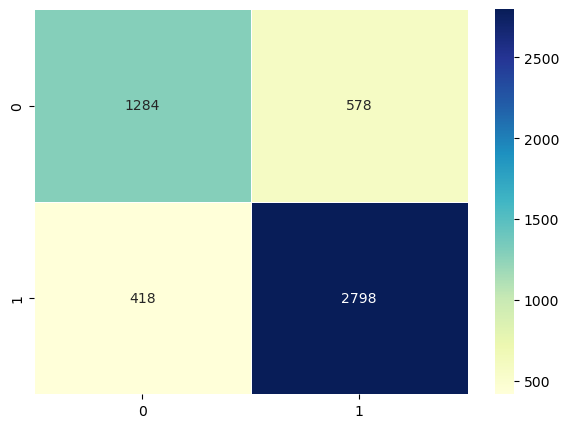

In [26]:
#creates a grid to plot on
f, ax = plt.subplots(figsize=(7, 5))
#plots confusion matrix
sns.heatmap(confusion_matrix(y_test, y_pred1),annot=True, fmt="d", linewidths=.5, cmap="YlGnBu")

In [27]:
## Logistic Regression

### Train Model
clf2 = LogisticRegression()
clf2.fit(x_train_vectors, y_train)

D:\ProgrammeDownload\Anaconda3\envs\envGEOG0051\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

0.7930820596865666
0.8146908231587239


<AxesSubplot: >

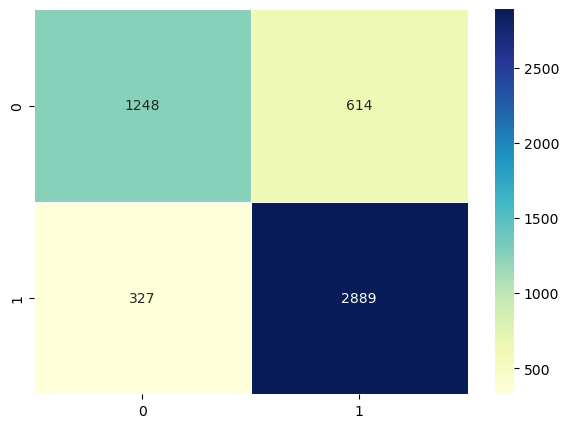

In [28]:
### Evaluate Model
y_pred2 = clf2.predict(x_test_vectors)

print (f1_score(y_test, y_pred2, average='macro')) #f1 score
print (accuracy_score(y_test, y_pred2)) #accuracy score

#creates a grid to plot on
f, ax = plt.subplots(figsize=(7, 5))
#plots confusion matrix
sns.heatmap(confusion_matrix(y_test, y_pred2),annot=True, fmt="d", linewidths=.5, cmap="YlGnBu")

In [29]:
## Support Vector Machine

### Train Model
clf3 = svm.SVC()
clf3.fit(x_train_vectors, y_train)

SVC()

0.7766620010911727
0.8074044899566759


<AxesSubplot: >

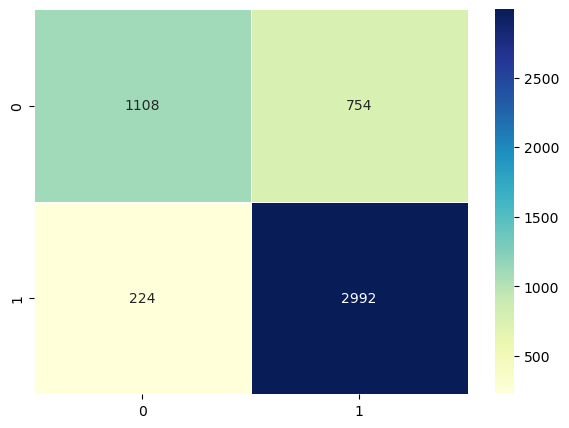

In [30]:
### Evaluate Model
y_pred3 = clf3.predict(x_test_vectors)

print (f1_score(y_test, y_pred3, average='macro')) #f1 score
print (accuracy_score(y_test, y_pred3)) #accuracy score

#creates a grid to plot on
f, ax = plt.subplots(figsize=(7, 5))
#plots confusion matrix
sns.heatmap(confusion_matrix(y_test, y_pred3),annot=True, fmt="d", linewidths=.5, cmap="YlGnBu")

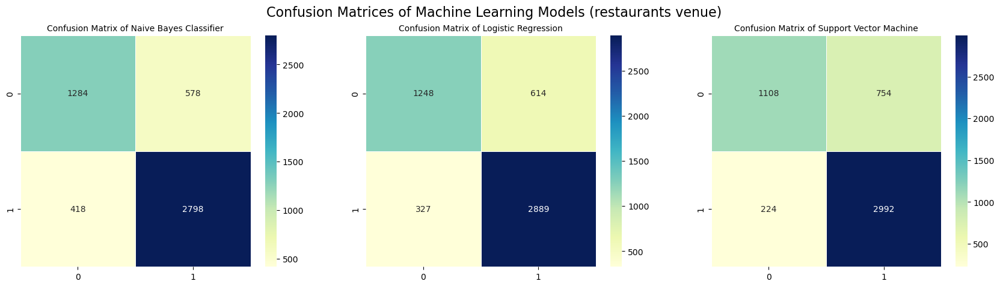

In [31]:
## multiple sub-figures of confusion matrix in sample dataset
fig, axs = plt.subplots(1, 3, figsize=(21, 5))

# Plot the first subplot - Confusion matrix of Naive Bayes Classifier
sns.heatmap(confusion_matrix(y_test, y_pred1),annot=True, fmt="d", linewidths=.5, cmap="YlGnBu", ax=axs[0])
axs[0].set_title('Confusion Matrix of Naive Bayes Classifier',fontsize=10)

# Plot the second subplot - Confusion matrix of Logistic Regression
sns.heatmap(confusion_matrix(y_test, y_pred2),annot=True, fmt="d", linewidths=.5, cmap="YlGnBu", ax=axs[1])
axs[1].set_title('Confusion Matrix of Logistic Regression',fontsize=10)

# Plot the third subplot - Confusion matrix of Support Vector Machine
sns.heatmap(confusion_matrix(y_test, y_pred3),annot=True, fmt="d", linewidths=.5, cmap="YlGnBu", ax=axs[2])
axs[2].set_title('Confusion Matrix of Support Vector Machine',fontsize=10)

fig.suptitle('Confusion Matrices of Machine Learning Models (restaurants venue)', fontsize=16)

# Show the figure
plt.show()

In [32]:
# Report the model results based on out-of-sample testset df_a

df_a = df_a.dropna()

dataset1 = df_a.sample(frac=1, random_state=1)
documents1 = dataset1['clean_text'].tolist()

no_features = 1000
tf_vectorizer = CountVectorizer(max_df=0.95, min_df=2, max_features=no_features)
tf_vectorizer.fit_transform(documents1)
print(tf_vectorizer.get_feature_names_out())

dataset1.loc[dataset1['stars_y'] >= 4, 'polarity_score'] = 'positive polarity'
dataset1.loc[dataset1['stars_y'] <= 3, 'polarity_score'] = 'negative polarity'

dataset1

['absolut' 'abund' 'access' 'accommod' 'achiev' 'act' 'action' 'addit'
 'address' 'adjac' 'admit' 'advantag' 'advertis' 'afternoon' 'age' 'agent'
 'aint' 'air' 'airlin' 'airplan' 'airport' 'albeit' 'alberta' 'alcohol'
 'allow' 'alright' 'alway' 'amaz' 'amen' 'american' 'amount' 'ampl'
 'announc' 'answer' 'anyon' 'anyth' 'aok' 'apolog' 'appreci' 'arcad'
 'architect' 'architectur' 'area' 'arent' 'arm' 'arrang' 'array' 'arriv'
 'arrivalsdepartur' 'art' 'artwork' 'ask' 'assist' 'attack' 'attend'
 'attitud' 'austin' 'avi' 'avid' 'avoid' 'aw' 'awesom' 'awkward' 'babi'
 'bag' 'baggag' 'banff' 'bar' 'basic' 'bathroom' 'beat' 'beauti' 'becom'
 'beef' 'beep' 'beer' 'begin' 'belt' 'beverag' 'bike' 'bin' 'bit' 'bitch'
 'bite' 'bizarr' 'blah' 'bland' 'blow' 'board' 'bodi' 'book' 'booth'
 'booz' 'border' 'bore' 'bother' 'bottl' 'bought' 'bound' 'brand' 'bread'
 'breakfast' 'breath' 'breez' 'bridg' 'bright' 'bring' 'broken' 'brows'
 'btw' 'bu' 'build' 'built' 'bump' 'bunch' 'burger' 'buse' 'busi' 'bu

,business_id,name,latitude,longitude,categories,stars_y,useful,funny,cool,text,clean_text,sentiment,polarity_score
67,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",2.0,1,0,0,Not sure if this new airport is an improvement...,sure airport improv one there nexu secur line ...,0.3182,negative polarity
250,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",3.0,0,0,2,Standard Canadian McAirport. Little personalit...,standard mcairport person noth memori fact sec...,-0.6643,negative polarity
230,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",4.0,3,1,2,Having flown through here several times now th...,flown time thing place open gate hall bright l...,0.3400,positive polarity
161,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",3.0,2,1,1,Airport is generally pretty clean and easy lay...,airport clean layout secur bit hit miss seem p...,0.2732,negative polarity
91,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",4.0,2,2,2,So what it's an ugly airport in comparison to ...,airport comparison yvr check agent ive live ri...,0.6726,positive polarity
...,...,...,...,...,...,...,...,...,...,...,...,...,...
137,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",3.0,5,6,7,"OK YYC, I concede. I was in a bit of a bad moo...",yyc conced bit mood pukey toddler time review ...,0.6124,negative polarity
72,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",2.0,2,1,0,"I'll give them 2 stars, on the way into Canada...",ill star way way doesnt yelp offer zero line s...,-0.4939,negative polarity
140,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",4.0,7,4,5,I can't believe that I came through here and f...,cant forgot write review airport remodel lane ...,0.3400,positive polarity
235,KMjpXsJFNiqE18orsi4stQ,YYC Calgary International Airport,51.125061,-114.01689,"Airports, Hotels & Travel",1.0,2,1,1,The airport has been remodeled. It's huge and...,airport thing walk peopl signag custom offici ...,0.7050,negative polarity


In [33]:
# Split dataset
x1_vectors = tf_vectorizer.transform(documents1)
y1_labels=dataset1['polarity_score']

0.46819413648681946
0.4860557768924303


<AxesSubplot: >

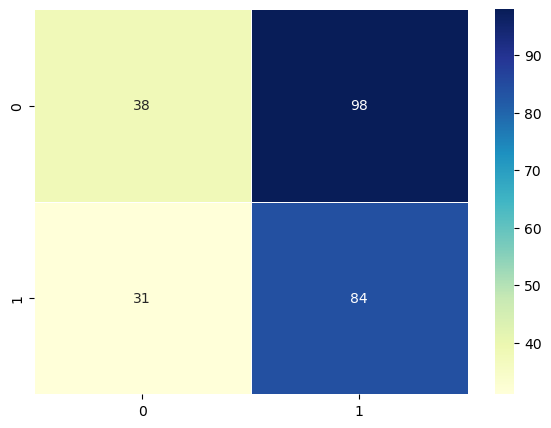

In [34]:
## Naive Bayes Classifier
y1_pred1 = clf1.predict(x1_vectors)

print (f1_score(y1_labels, y1_pred1, average='macro')) #f1 score
print (accuracy_score(y1_labels, y1_pred1)) #accuracy score

#creates a grid to plot on
f, ax = plt.subplots(figsize=(7, 5))
#plots confusion matrix
sns.heatmap(confusion_matrix(y1_labels, y1_pred1),annot=True, fmt="d", linewidths=.5, cmap="YlGnBu")

0.49739687625150175
0.50199203187251


<AxesSubplot: >

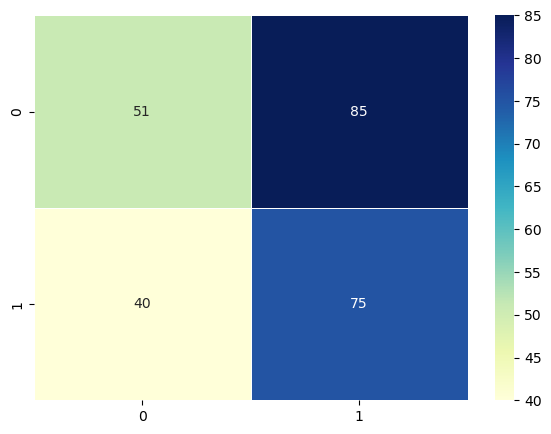

In [35]:
## Logistic Regression
y1_pred2 = clf2.predict(x1_vectors)

print (f1_score(y1_labels, y1_pred2, average='macro')) #f1 score
print (accuracy_score(y1_labels, y1_pred2)) #accuracy score

#creates a grid to plot on
f, ax = plt.subplots(figsize=(7, 5))
#plots confusion matrix
sns.heatmap(confusion_matrix(y1_labels, y1_pred2),annot=True, fmt="d", linewidths=.5, cmap="YlGnBu")

0.4763907284768212
0.49800796812749004


<AxesSubplot: >

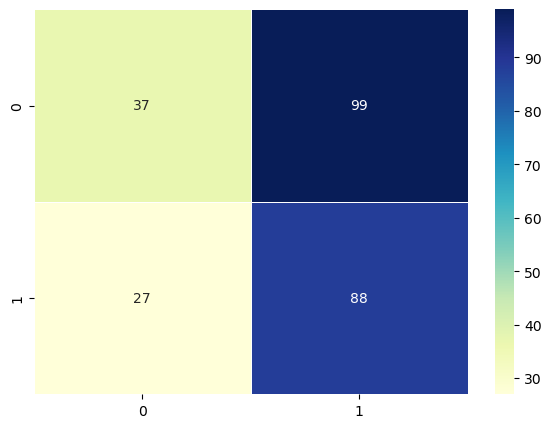

In [36]:
## Support Vector Machine
y1_pred3 = clf3.predict(x1_vectors)

print (f1_score(y1_labels, y1_pred3, average='macro')) #f1 score
print (accuracy_score(y1_labels, y1_pred3)) #accuracy score

#creates a grid to plot on
f, ax = plt.subplots(figsize=(7, 5))
#plots confusion matrix
sns.heatmap(confusion_matrix(y1_labels, y1_pred3),annot=True, fmt="d", linewidths=.5, cmap="YlGnBu")

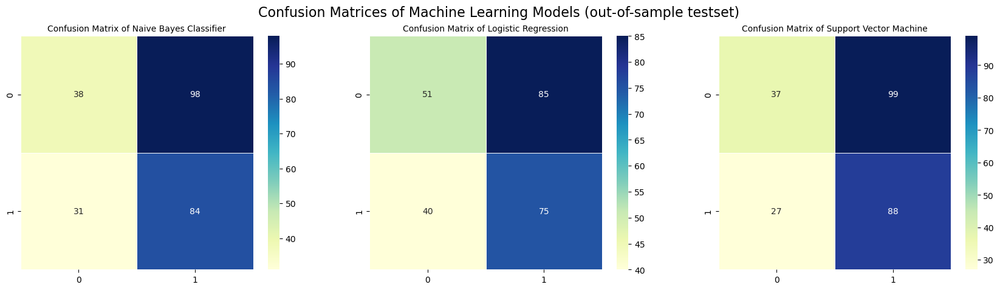

In [37]:
## multiple sub-figures of confusion matrix in out-of-sample testset
fig, axs = plt.subplots(1, 3, figsize=(21, 5))

# Plot the first subplot - Confusion matrix of Naive Bayes Classifier
sns.heatmap(confusion_matrix(y1_labels, y1_pred1),annot=True, fmt="d", linewidths=.5, cmap="YlGnBu", ax=axs[0])
axs[0].set_title('Confusion Matrix of Naive Bayes Classifier',fontsize=10)

# Plot the second subplot - Confusion matrix of Logistic Regression
sns.heatmap(confusion_matrix(y1_labels, y1_pred2),annot=True, fmt="d", linewidths=.5, cmap="YlGnBu", ax=axs[1])
axs[1].set_title('Confusion Matrix of Logistic Regression',fontsize=10)

# Plot the third subplot - Confusion matrix of Support Vector Machine
sns.heatmap(confusion_matrix(y1_labels, y1_pred3),annot=True, fmt="d", linewidths=.5, cmap="YlGnBu", ax=axs[2])
axs[2].set_title('Confusion Matrix of Support Vector Machine',fontsize=10)

fig.suptitle('Confusion Matrices of Machine Learning Models (out-of-sample testset)', fontsize=16)

# Show the figure
plt.show()

#### 3.2.3 Geospatial analysis and visualisation of review data

In [8]:
# variables: average sentiment score and the average stars for each restaurant
restaurants_loc = dfr[['business_id','name', 'categories','latitude', 'longitude']].drop_duplicates()
restaurants_avg = pd.merge(dfr1, restaurants_loc, on='business_id')
restaurants_avg.head()

,business_id,sentiment,stars_y,name,categories,latitude,longitude
0,--1UhMGODdWsrMastO9DZw,0.235393,4.000000,The Spicy Amigos,"Restaurants, Mexican",51.049673,-114.079977
1,-0RU0vASJOV383dYA8VZgA,0.499150,3.666667,Pho Hoan Pasteur,"Noodles, Restaurants, Vietnamese",50.898863,-113.941861
2,-1u4Q4U6OZ-CvqoxUh7gKg,0.427535,4.117647,Las Canarias,"Tapas Bars, Spanish, Tapas/Small Plates, Resta...",51.037654,-114.088942
3,-2C96suwzrE_cqI1U69cLA,0.549276,3.684211,Open Sesame,"Asian Fusion, Restaurants, Japanese, Nightlife...",50.992148,-114.070811
4,-2WW_cjFa9-UwKSmbEs78Q,0.493780,4.100000,Yum Yum BBQ Chicken,"Restaurants, Korean, Barbeque",50.962673,-114.087439


In [9]:
# Convert the data to a geopandas GeoDataFrame
geometry = gpd.points_from_xy(restaurants_avg['longitude'], restaurants_avg['latitude'])
gdf = gpd.GeoDataFrame(restaurants_avg, geometry=geometry)
gdf.head()

,business_id,sentiment,stars_y,name,categories,latitude,longitude,geometry
0,--1UhMGODdWsrMastO9DZw,0.235393,4.000000,The Spicy Amigos,"Restaurants, Mexican",51.049673,-114.079977,POINT (-114.07998 51.04967)
1,-0RU0vASJOV383dYA8VZgA,0.499150,3.666667,Pho Hoan Pasteur,"Noodles, Restaurants, Vietnamese",50.898863,-113.941861,POINT (-113.94186 50.89886)
2,-1u4Q4U6OZ-CvqoxUh7gKg,0.427535,4.117647,Las Canarias,"Tapas Bars, Spanish, Tapas/Small Plates, Resta...",51.037654,-114.088942,POINT (-114.08894 51.03765)
3,-2C96suwzrE_cqI1U69cLA,0.549276,3.684211,Open Sesame,"Asian Fusion, Restaurants, Japanese, Nightlife...",50.992148,-114.070811,POINT (-114.07081 50.99215)
4,-2WW_cjFa9-UwKSmbEs78Q,0.493780,4.100000,Yum Yum BBQ Chicken,"Restaurants, Korean, Barbeque",50.962673,-114.087439,POINT (-114.08744 50.96267)


In [40]:
print(gdf.crs)

None


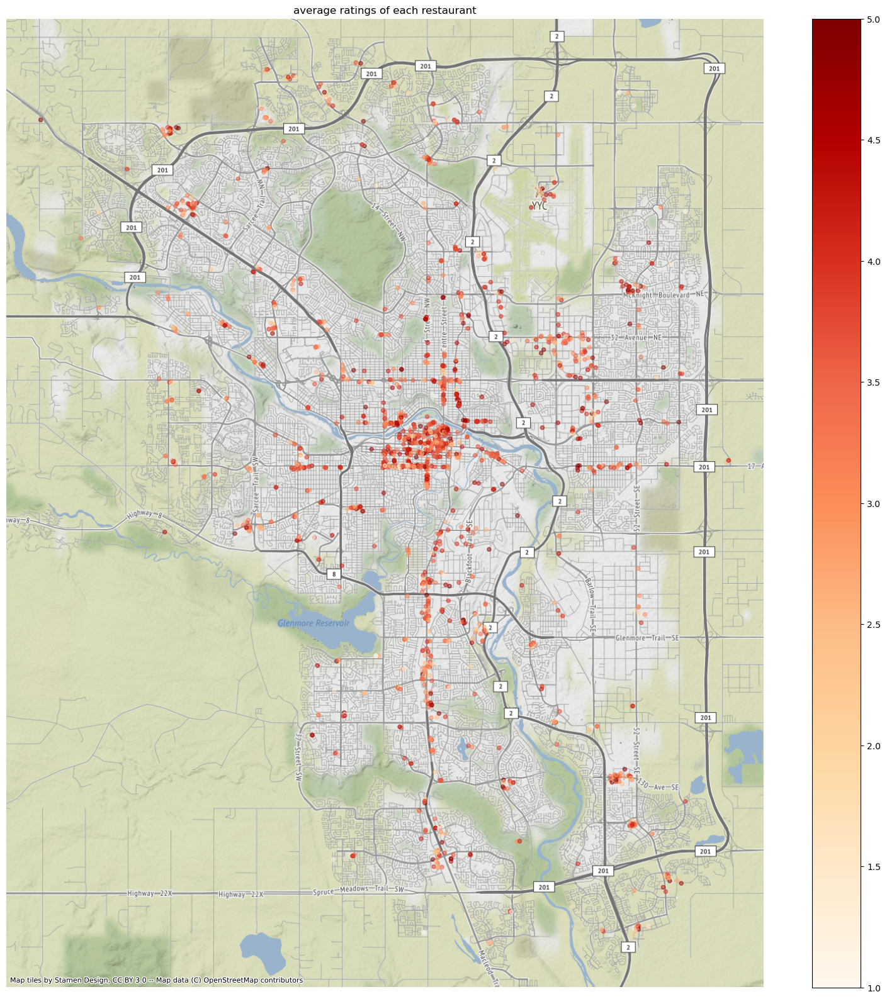

In [41]:
gdf = gdf.set_crs(epsg=4269)
gdf = gdf.to_crs(epsg=3857)

# Create a Matplotlib figure and axis object
fig, ax = plt.subplots(figsize=(20, 20))

# Plot the points and map the color to check-in counts
gdf.plot(column='stars_y', cmap='OrRd', markersize=20,alpha=0.5, ax=ax, legend=True)

# Add a title to the plot
ax.set_title('average ratings of each restaurant')

# add a basemap using contextilly
cx.add_basemap(ax, crs=gdf.crs.to_string())
plt.axis('off')
plt.show()

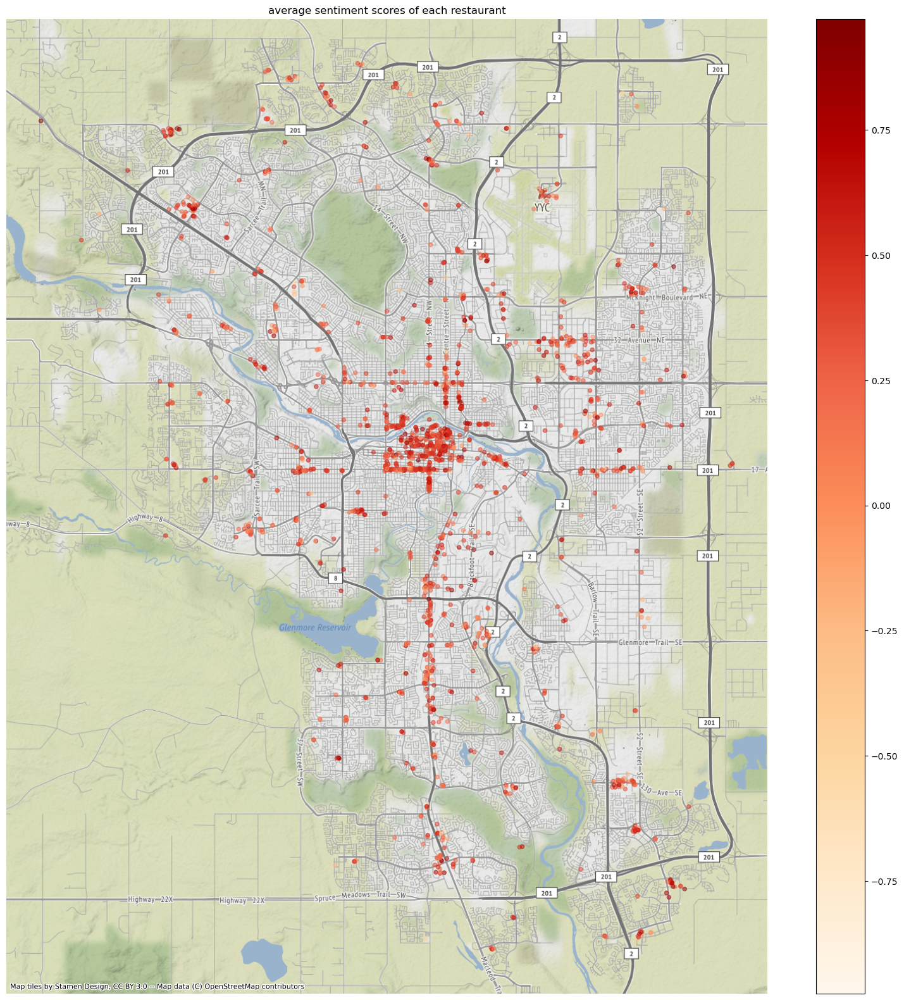

In [42]:
# Create a Matplotlib figure and axis object
fig, ax = plt.subplots(figsize=(20, 20))

# Plot the points and map the color to check-in counts
gdf.plot(column='sentiment', cmap='OrRd', markersize=20,alpha=0.5, ax=ax, legend=True)

# Add a title to the plot
ax.set_title('average sentiment scores of each restaurant')

# add a basemap using contextilly
cx.add_basemap(ax, crs=gdf.crs.to_string())
plt.axis('off')
plt.show()

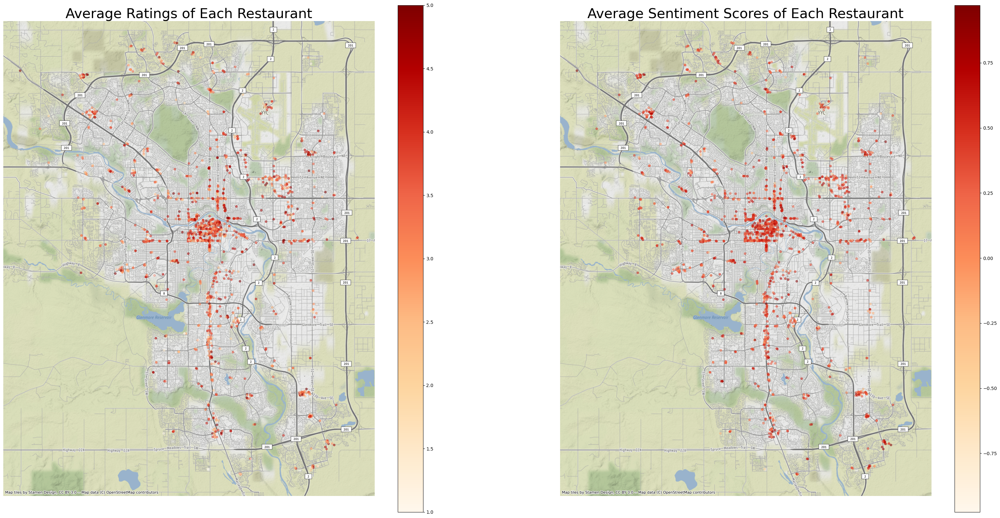

In [43]:
# multiple sub-figures
fig, axs = plt.subplots(1, 2, figsize=(40, 20))

# Plot the first subplot - average ratings
gdf.plot(column='stars_y', cmap='OrRd', markersize=20,alpha=0.5, ax=axs[0], legend=True)
axs[0].set_title('Average Ratings of Each Restaurant',fontsize=30)
cx.add_basemap(axs[0], crs=gdf.crs.to_string())
axs[0].axis('off')

# Plot the second subplot - average sentiment scores
gdf.plot(column='sentiment', cmap='OrRd', markersize=20,alpha=0.5, ax=axs[1], legend=True)
axs[1].set_title('Average Sentiment Scores of Each Restaurant',fontsize=30)
cx.add_basemap(axs[1], crs=gdf.crs.to_string())
axs[1].axis('off')

# Show the figure
plt.show()

#### 3.2.4 Business Intelligence Application Question

In [45]:
## Heatmap of Average ratings of each restaurant

import folium
from folium.plugins import MarkerCluster

# Convert GeoDataFrame to GeoJSON
geojson_data = gdf.to_json()

# Create a map object
m = folium.Map(location=[gdf['latitude'].mean(), gdf['longitude'].mean()], zoom_start=10)

# Create a marker cluster layer and add it to the map
marker_cluster = MarkerCluster().add_to(m)
folium.GeoJson(geojson_data, name='geojson').add_to(marker_cluster)

# Add a heatmap layer to the map
heat_data = gdf[['latitude', 'longitude', 'stars_y']].values.tolist()
folium.plugins.HeatMap(heat_data, name='heat').add_to(m)

# Add a layer control to the map
folium.LayerControl().add_to(m)

# Save and display the map
m.save('map.html')
m


In [10]:
## Location of each restaurants

# Create a map object
m1 = folium.Map(location=[gdf['latitude'].mean(), gdf['longitude'].mean()], zoom_start=10)

# Iterate over each row in the GeoDataFrame and create a marker for each point
for index, row in gdf.iterrows():
    # Create a marker at the point location
    marker = folium.Marker(
        location=[row['latitude'], row['longitude']],
        tooltip=row['categories'] + ': ' + str(row['stars_y']),  # Add a tooltip with the name and rating
        icon=folium.Icon(color='red', prefix='fa', icon='cutlery')  # Use a red fork and knife icon for the marker
    )
    # Add the marker to the map
    marker.add_to(m1)

# Save and display the map
m1.save('map.html')

m1
